# **CSPDarkNet Class**
OS = Linux <br/>
Complete Backbone Documentation: https://keras.io/api/keras_cv/models/backbones/csp_darknet/#cspdarknetxlbackbone-class

In [6]:
import tensorflow as tf
import keras_cv.models
from tensorflow.keras.utils import plot_model
import IPython.display as display
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image
from tensorflow.keras.models import Model

model =keras_cv.models.CSPDarkNetBackbone.from_preset(
    "csp_darknet_xl",
)


def load_image(img_path, target_size=(640, 640)):
    img = Image.open(img_path).convert('RGB')  # Convert to RGB to ensure 3 channels
    img = img.resize(target_size)
    img_array = np.array(img) / 255.0
    img_array = np.expand_dims(img_array, axis=0)  # Add batch dimension
    return img_array

image_path = 'data/download1.png'  # Replace with your image path
input_image = load_image(image_path)


# Pass the image through the model
features = model(input_image)

# Create a model that gives outputs of all intermediate layers
layer_outputs = [layer.output for layer in model.layers]
activation_model = Model(inputs=model.input, outputs=layer_outputs)

# Get the activations for the input image
activations = activation_model.predict(input_image)

def display_activation_maps(activations, input_img, layer_names, n_cols=4):
    n_rows = len(activations)
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 15))
    
    for i, (activation, layer_name) in enumerate(zip(activations, layer_names)):
        num_filters = activation.shape[-1]
        for col in range(n_cols):
            filter_index = col
            if filter_index < num_filters:
                activation_img = activation[0, :, :, filter_index]
                activation_img -= activation_img.mean()
                activation_img /= activation_img.std()
                activation_img *= 64
                activation_img += 128
                activation_img = np.clip(activation_img, 0, 255).astype('uint8')
                
                ax = axes[i, col]
                ax.imshow(input_img)
                ax.imshow(activation_img, cmap='viridis', alpha=0.6)
                ax.axis('off')
                
        # Set layer name as the title for the first column of each row
        axes[i, 0].set_title(layer_name)
    
    plt.show()

model.summary()

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Model: "csp_dark_net_backbone"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_136     │ (None, None,      │          0 │ -                 │
│ (InputLayer)        │ None, 3)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling_2         │ (None, None,      │          0 │ input_layer_136[… │
│ (Rescaling)         │ None, 3)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ get_item_8          │ (None, None,      │          0 │ rescaling_2[0][0] │
│ (GetItem)           │ None, 3)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ get_item_9          │ (None, None,      │          0 │ rescaling_2[0][0] │
│ (GetItem)           │ None, 3)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ get_item_10         │ (None, None,      │          0 │ rescaling_2[0][0] │
│ (GetItem)           │ None, 3)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ get_item_11         │ (None, None,      │          0 │ rescaling_2[0][0] │
│ (GetItem)           │ None, 3)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_focus          │ (None, None,      │          0 │ get_item_8[0][0], │
│ (Concatenate)       │ None, 12)         │            │ get_item_9[0][0], │
│                     │                   │            │ get_item_10[0][0… │
│                     │                   │            │ get_item_11[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv           │ (None, None,      │      9,520 │ stem_focus[0][0]  │
│ (Sequential)        │ None, 85)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dark2_conv          │ (None, None,      │    130,730 │ stem_conv[0][0]   │
│ (Sequential)        │ None, 170)        │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dark2_csp           │ (None, None,      │    350,880 │ dark2_conv[0][0]  │
│ (CrossStagePartial) │ None, 170)        │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dark3_conv          │ (None, None,      │    521,560 │ dark2_csp[0][0]   │
│ (Sequential)        │ None, 340)        │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dark3_csp           │ (None, None,      │  3,718,240 │ dark3_conv[0][0]  │
│ (CrossStagePartial) │ None, 340)        │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dark4_conv          │ (None, None,      │  2,083,520 │ dark3_csp[0][0]   │
│ (Sequential)        │ None, 680)        │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dark4_csp           │ (None, None,      │ 14,834,880 │ dark4_conv[0][0]  │
│ (CrossStagePartial) │ None, 680)        │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dark5_conv          │ (None, None,      │  8,328,640 │ dark4_csp[0][0]   │
│ (Sequential)        │ None, 1360)       │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dark5_spp_conv1     │ (None, None,      │    927,520 │ dark5_conv[0][0]  │
│ (Sequential)        │ None, 680)        │            │                 

 Total params: 56,837,970 (216.82 MB)

 Trainable params: 56,781,700 (216.60 MB)

 Non-trainable params: 56,270 (219.80 KB)

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


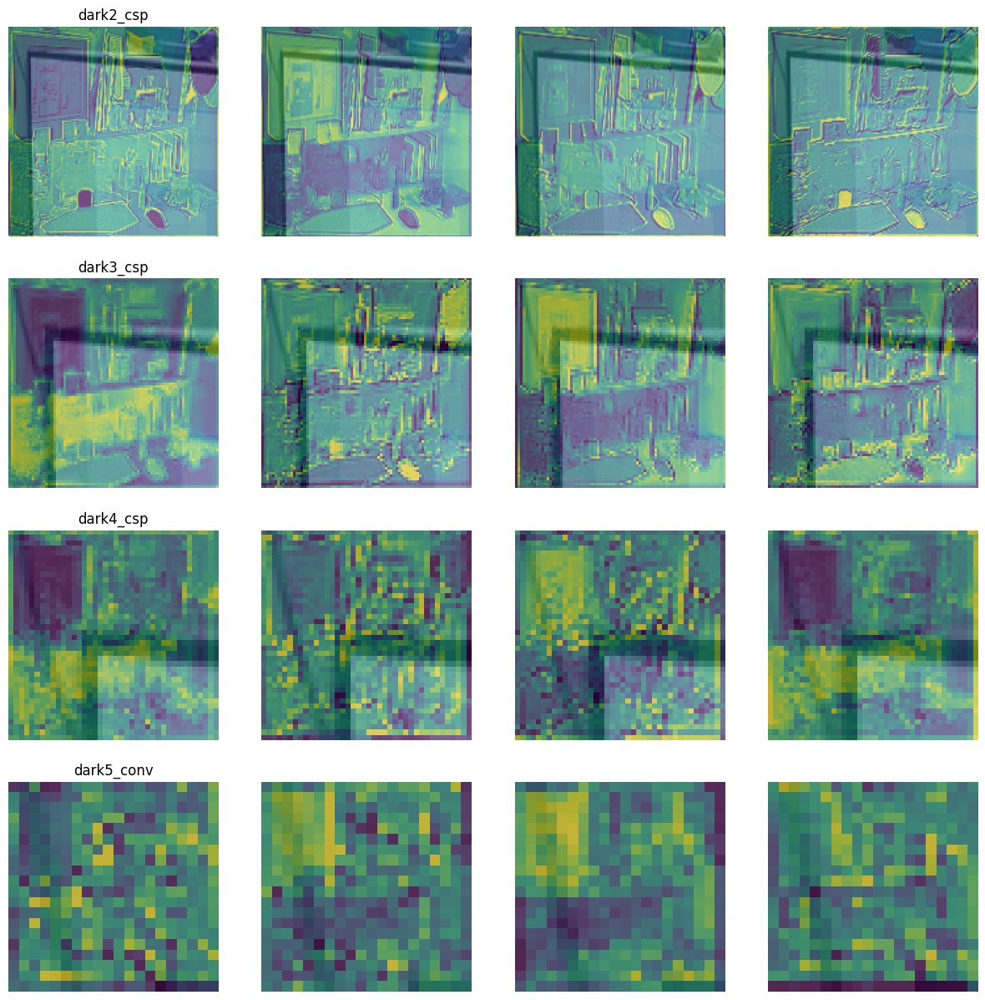

In [7]:
# intermediate outputs
layer_names = ['dark2_csp', 'dark3_csp', 'dark4_csp', 'dark5_conv']  # Filter for convolutional layers
intermediate_model = Model(inputs=model.input, outputs=[model.get_layer(name).output for name in layer_names])

# Get the activations for the input image
activations = intermediate_model.predict(input_image)

# Visualize the activation maps
input_img = np.array(Image.open(image_path).resize((640, 640)))
display_activation_maps(activations, input_img, layer_names)

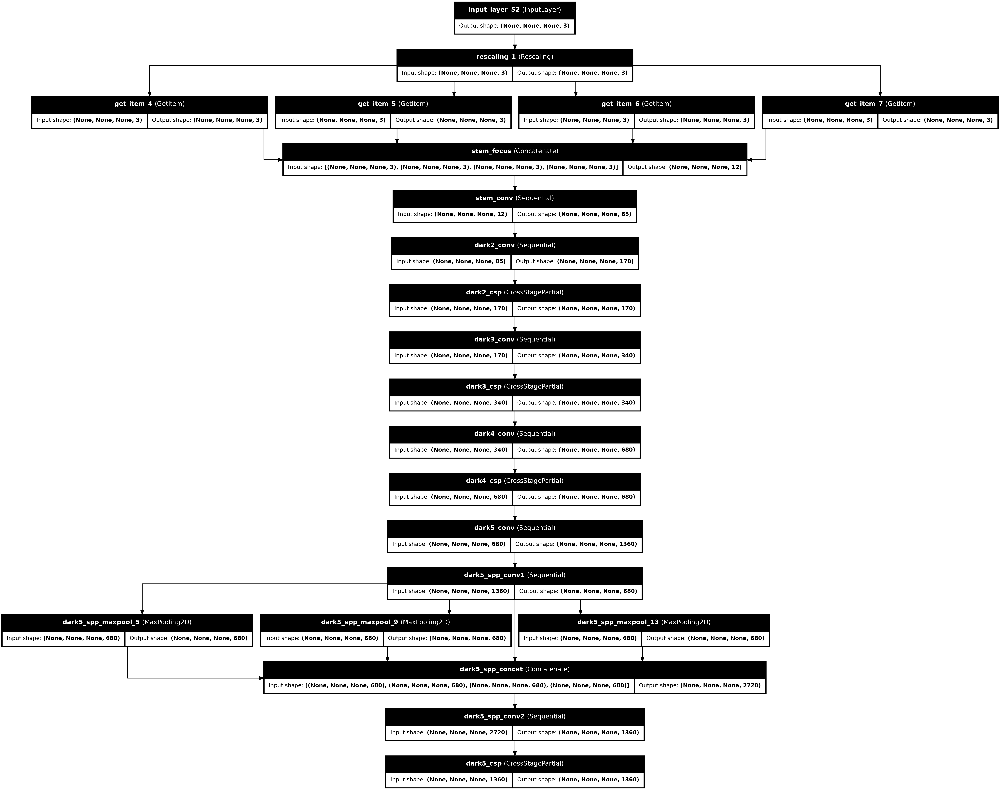

In [5]:
plot_model(model, to_file='model2.png', show_shapes=True, show_layer_names=True)

In [1]:
import tensorflow as tf
import keras_cv.models
from tensorflow.keras.utils import plot_model
import IPython.display as display
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image
from tensorflow.keras.models import Model

model =keras_cv.models.CSPDarkNetBackbone.from_preset(
    "csp_darknet_xl",
)

2024-08-06 23:25:38.364898: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-08-06 23:25:38.369041: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2024-08-06 23:25:38.389809: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2024-08-06 23:25:38.420820: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-08-06 23:25:38.446301: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been 

## **Inference on High resolution image with small objects** 
(3000x3000 px vs an avg object of 200x200 px)

In [2]:
def load_image_b(img_path, target_size=(3000, 3000)):
    img = Image.open(img_path).convert('RGB')  # Convert to RGB to ensure 3 channels
    img = img.resize(target_size)
    img_array = np.array(img) / 255.0
    img_array = np.expand_dims(img_array, axis=0)  # Add batch dimension
    return img_array

image_b = 'data/illustrator_5.jpg'  # Replace with your image path
input_b = load_image_b(image_b)


# Pass the image through the model
features = model(input_b)

# Create a model that gives outputs of all intermediate layers
layer_outputs = [layer.output for layer in model.layers]
activation_model = Model(inputs=model.input, outputs=layer_outputs)

# Get the activations for the input image
activations = activation_model.predict(input_b)

def display_activation_maps(activations, input_img, layer_names, n_cols=4):
    n_rows = len(activations)
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(100, 100))
    
    for i, (activation, layer_name) in enumerate(zip(activations, layer_names)):
        num_filters = activation.shape[-1]
        for col in range(n_cols):
            filter_index = col
            if filter_index < num_filters:
                activation_img = activation[0, :, :, filter_index]
                activation_img -= activation_img.mean()
                activation_img /= activation_img.std()
                activation_img *= 64
                activation_img += 128
                activation_img = np.clip(activation_img, 0, 255).astype('uint8')
                
                ax = axes[i, col]
                ax.imshow(input_img)
                ax.imshow(activation_img, cmap='viridis', alpha=0.6)
                ax.axis('off')
                
        # Set layer name as the title for the first column of each row
        axes[i, 0].set_title(layer_name)
    
    plt.show()


# intermediate outputs
layer_names = ['dark2_csp', 'dark3_csp', 'dark4_csp', 'dark5_conv']  # Filter for convolutional layers
intermediate_model = Model(inputs=model.input, outputs=[model.get_layer(name).output for name in layer_names])

# Get the activations for the input image
activations = intermediate_model.predict(input_b)

# Visualize the activation maps
input_img = np.array(Image.open(image_b).resize((3000, 3000)))
display_activation_maps(activations, input_img, layer_names)

1/1 ━━━━━━━━━━━━━━━━━━━━ 25s 25s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 22s 22s/step
